## BLIP2-OPT-2.7B

In [83]:
# pip install accelerate
from PIL import Image
from transformers import Blip2Processor, Blip2ForConditionalGeneration

processor = Blip2Processor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2ForConditionalGeneration.from_pretrained("Salesforce/blip2-opt-2.7b", device_map="auto")


preprocessor_config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/882 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/3.56M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/23.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

processor_config.json:   0%|          | 0.00/68.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.03k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/122k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/10.0G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

In [84]:
image_path = '/kaggle/input/val-photos/000000000241.jpg'
raw_image = Image.open(image_path).convert('RGB')


In [85]:
question = "description"
inputs = processor(raw_image, return_tensors="pt")
inputs.to("cuda")
out = model.generate(**inputs, max_length=500, num_beams=5)
generated_text = processor.decode(out[0], skip_special_tokens=True).strip()

print(generated_text)

a group of people in a living room playing a video game


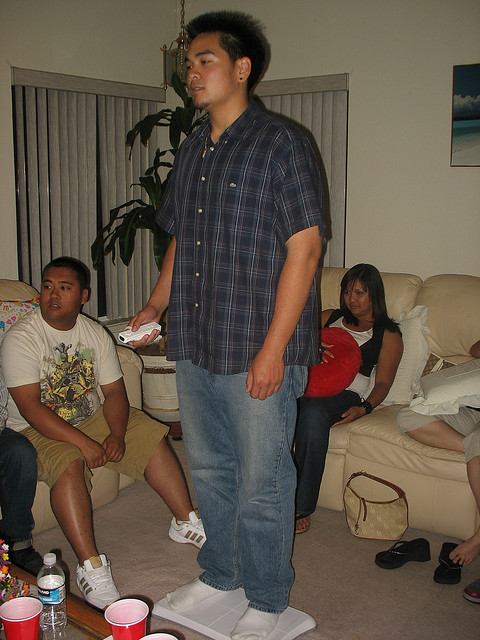

In [4]:
raw_image

In [90]:
import time

start = time.time()

image_path = '/kaggle/input/val-photos/000000006771.jpg'
raw_image = Image.open(image_path).convert('RGB')

question = "detalized description"
inputs = processor(raw_image, return_tensors="pt")
inputs.to("cuda")
out = model.generate(**inputs, max_length=500, num_beams=1)
generated_text = processor.decode(out[0], skip_special_tokens=True).strip()

print(generated_text, f'\ntime={time.time() - start:.2f}')

a woman wearing a costume 
time=9.94


1. Нет поддержки русского языка
2. Слишком короткие описания
3. Долгий инференс:  
   20 секунд при num_beams=5,  
   10 секунд при num_beams=3 на Tesla P100.  
   На моей видеокарте gtx 1080ti инференс занимал 2-4 минуты

## Blip large (0.47B)

In [91]:
import requests
from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration

processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large").to("cuda")


In [94]:
import time 


img_url = '/kaggle/input/val-photos/000000000241.jpg' 
raw_image = Image.open(img_url).convert('RGB')

# # conditional image captioning
# text = "a photography of"
# inputs = processor(raw_image, text, return_tensors="pt").to("cuda")

# out = model.generate(**inputs)
# print(processor.decode(out[0], skip_special_tokens=True))

start = time.time()
# unconditional image captioning
inputs = processor(raw_image, return_tensors="pt").to("cuda")

out = model.generate(**inputs)
print(processor.decode(out[0], skip_special_tokens=True), 
      f'\ntime={time.time() - start:.2f}')

there are people sitting in a living room watching a man play a video game 
time=0.37


In [ ]:
'https://i.mycdn.me/getVideoPreview?id=6930568579716&idx=7&type=39&tkn=DDgPNJr0LjB9YbCRil9FWQseduM&fn=vid_w'

In [78]:
img_url = 'https://i.mycdn.me/getVideoPreview?id=6930568579716&idx=7&type=39&tkn=DDgPNJr0LjB9YbCRil9FWQseduM&fn=vid_w'
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')

# conditional image captioning
text = "a photography of"
inputs = processor(raw_image, text, return_tensors="pt").to("cuda")

out = model.generate(**inputs)
print(processor.decode(out[0], skip_special_tokens=True))

# unconditional image captioning
inputs = processor(raw_image, return_tensors="pt").to("cuda")

out = model.generate(**inputs)
print(processor.decode(out[0], skip_special_tokens=True))


a photography of a group of rabbits sitting on a log in the snow
cartoon of a group of rabbits sitting on a log in the snow


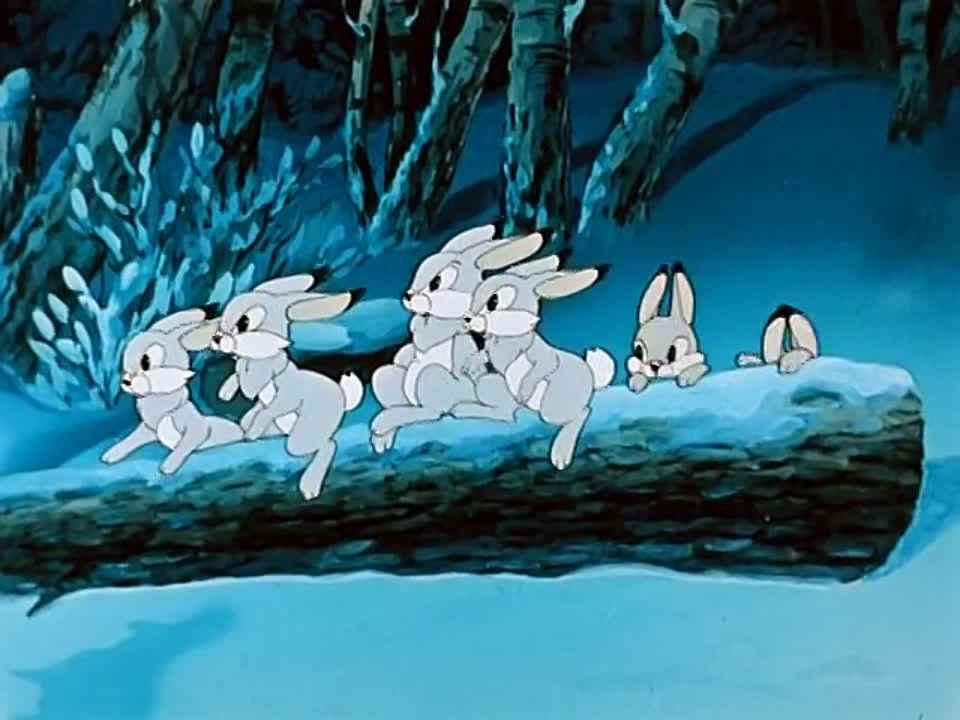

In [79]:
raw_image

1. Нет поддержки русского языка
2. Качественные короткие описания
3. При этом быстрый инференс

## Florence-2-large (0.77B)

In [ ]:
import torch
from PIL import Image
from transformers import AutoProcessor, AutoModelForCausalLM 


device = "cuda:0" if torch.cuda.is_available() else "cpu"

model_id = 'microsoft/Florence-2-large'
model = AutoModelForCausalLM.from_pretrained(model_id, trust_remote_code=True, torch_dtype='auto').to(device)
processor = AutoProcessor.from_pretrained(model_id, trust_remote_code=True)


In [43]:
prompt = "<MORE_DETAILED_CAPTION>"

image_path = '/kaggle/input/val-photos/000000000241.jpg'
image = Image.open(image_path)

inputs = processor(text=prompt, images=image, return_tensors="pt").to(device, torch_dtype)


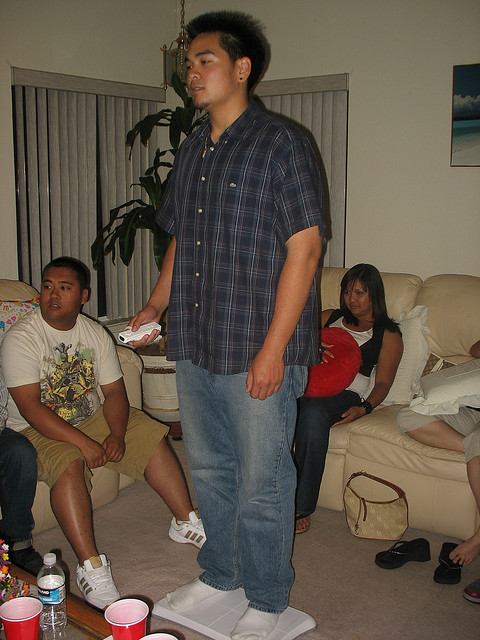

In [44]:
image

In [45]:
import time as time

start = time.time()

generated_ids = model.generate(
    input_ids=inputs["input_ids"],
    pixel_values=inputs["pixel_values"],
    max_new_tokens=600,
    num_beams=3,
    do_sample=False
)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

#parsed_answer = processor.post_process_generation(generated_text, task="<OD>", image_size=(image.width, image.height))

print(generated_text, f'\n time={time.time() - start:.2f}')

</s><s>The image shows a young man standing on a white scale in a living room. He is wearing a blue plaid shirt and blue jeans. He has short dark hair and is looking off to the side with a serious expression on his face. In the background, there are three people sitting on a beige couch, two men and a woman, and a coffee table with red cups and a bottle of water. There is also a plant in the corner of the room.</s> 
 time=1.71


In [46]:
import requests

prompt = "<MORE_DETAILED_CAPTION>"
url = "https://images.kinorium.com/movie/shot/357941/w1500_51984999.jpg"
image = Image.open(requests.get(url, stream=True).raw)

inputs = processor(text=prompt, images=image, return_tensors="pt").to(device, torch_dtype)

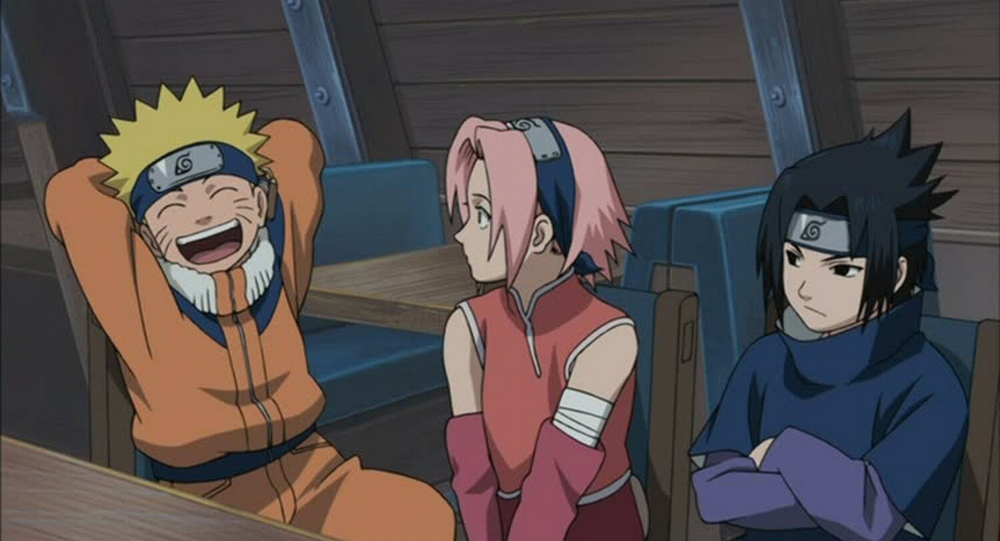

In [47]:
image

In [48]:
import time as time

start = time.time()

generated_ids = model.generate(
    input_ids=inputs["input_ids"],
    pixel_values=inputs["pixel_values"],
    max_new_tokens=600,
    num_beams=3,
    do_sample=False
)
generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]

#parsed_answer = processor.post_process_generation(generated_text, task="<OD>", image_size=(image.width, image.height))

print(generated_text, f'\n time={time.time() - start:.2f}')

</s><s>The image is a still from the animated series Naruto Shippuden. It shows three characters, Naruto, Sasuke, and Sakura, sitting on a bench in a room with wooden walls and stairs in the background. Naruto is on the left side of the image, wearing his signature orange jumpsuit and a blue headband. Sasuke is in the middle, with his arms crossed and a serious expression on his face. Sakura is on his right side, wearing a pink outfit and a white headband with the word "Naruto" written on it. All three characters appear to be engaged in a conversation.</s> 
 time=1.86


In [49]:
import matplotlib.pyplot as plt  
import matplotlib.patches as patches  
def plot_bbox(image, data):
   # Create a figure and axes  
    fig, ax = plt.subplots()  
      
    # Display the image  
    ax.imshow(image)  
      
    # Plot each bounding box  
    for bbox, label in zip(data['bboxes'], data['labels']):  
        # Unpack the bounding box coordinates  
        x1, y1, x2, y2 = bbox  
        # Create a Rectangle patch  
        rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=1, edgecolor='r', facecolor='none')  
        # Add the rectangle to the Axes  
        ax.add_patch(rect)  
        # Annotate the label  
        plt.text(x1, y1, label, color='white', fontsize=8, bbox=dict(facecolor='red', alpha=0.5))  
      
    # Remove the axis ticks and labels  
    ax.axis('off')  
      
    # Show the plot  
    plt.show()  

In [54]:
def run_example(task_prompt, text_input=None):
    if text_input is None:
        prompt = task_prompt
    else:
        prompt = task_prompt + text_input
    inputs = processor(text=prompt, images=image, return_tensors="pt").to('cuda', torch.float16)
    generated_ids = model.generate(
      input_ids=inputs["input_ids"].cuda(),
      pixel_values=inputs["pixel_values"].cuda(),
      max_new_tokens=1024,
      early_stopping=False,
      do_sample=False,
      num_beams=3,
    )
    generated_text = processor.batch_decode(generated_ids, skip_special_tokens=False)[0]
    parsed_answer = processor.post_process_generation(
        generated_text, 
        task=task_prompt, 
        image_size=(image.width, image.height)
    )

    return parsed_answer
    
url = "https://avatars.mds.yandex.net/i?id=ea2f2d8eceba56389a509f98bc77d872_l-5231779-images-thumbs&n=13"
image = Image.open(requests.get(url, stream=True).raw)


In [55]:
task_prompt = '<DENSE_REGION_CAPTION>'
results = run_example(task_prompt)
print(results)

{'<DENSE_REGION_CAPTION>': {'bboxes': [[3.1499998569488525, 23.849998474121094, 896.8499755859375, 864.449951171875], [400.04998779296875, 4.049999713897705, 832.0499877929688, 485.54998779296875], [488.25, 607.0499877929688, 835.6499633789062, 860.8499755859375], [1.3499999046325684, 112.94999694824219, 291.1499938964844, 392.8499755859375], [595.3499755859375, 6.75, 742.949951171875, 146.25]], 'labels': ['motocross rider in mid-air on orange KTM dirt bike', 'motocrosse rider on KTM motorcycle', 'wheel', 'wheel', 'helmet']}}


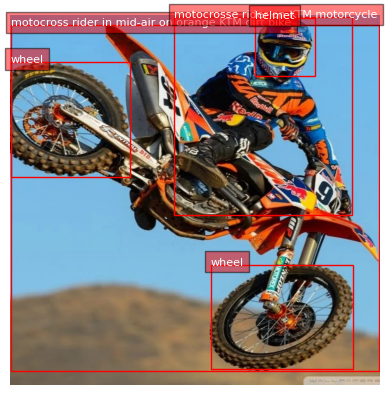

In [56]:
plot_bbox(image, results['<DENSE_REGION_CAPTION>'])

In [71]:

url = "https://i.ytimg.com/vi/78Q9fAsOk6M/maxresdefault.jpg?sqp=-oaymwEmCIAKENAF8quKqQMa8AEB-AHgB4AC0AWKAgwIABABGGUgYChRMA8=&amp;rs=AOn4CLAf2Aa6lZ9pQ_Ud-2N_n-dU9-vBpg"
image = Image.open(requests.get(url, stream=True).raw)


In [72]:
task_prompt = '<DENSE_REGION_CAPTION>'
results = run_example(task_prompt)
print(results)

{'<DENSE_REGION_CAPTION>': {'bboxes': [[85.1199951171875, 110.52000427246094, 611.2000122070312, 677.8800048828125], [492.1600036621094, 406.44000244140625, 1100.1600341796875, 688.6800537109375]], 'labels': ['cartoon character with bow and arrow in field', 'cartoon dog with backpack and bow in field']}}


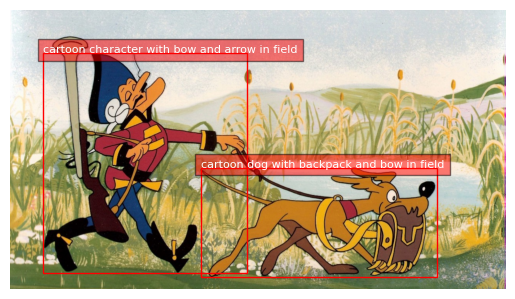

In [73]:
plot_bbox(image, results['<DENSE_REGION_CAPTION>'])

1. В модели нет поддержки русского языка, нужно дополнительно встраивать переводчик.
2. Качество описаний довольно хорошее при промпте "MORE_DETAILED_CAPTION". При этом поддерживает 3 разные степени детализации.
3. Модель описывает пространственные соотношения объектов.
4. Также модель поддерживает детектирование, сегментацию, пообъектное описание
5. Время инференса 2 секунды

## git-Large

In [20]:
from transformers import AutoProcessor, AutoModelForVision2Seq
import requests
from PIL import Image
import torch
import time

# Модель GIT
model_id = "microsoft/git-large"

processor = AutoProcessor.from_pretrained(model_id)
model = AutoModelForVision2Seq.from_pretrained(model_id).to("cuda")

url = "https://i.ytimg.com/vi/78Q9fAsOk6M/maxresdefault.jpg?sqp=-oaymwEmCIAKENAF8quKqQMa8AEB-AHgB4AC0AWKAgwIABABGGUgYChRMA8=&amp;rs=AOn4CLAf2Aa6lZ9pQ_Ud-2N_n-dU9-vBpg"
image = Image.open(requests.get(url, stream=True).raw)

text = "Describe this image"

start = time.time()

inputs = processor(images=image, return_tensors="pt").to("cuda")

generated_ids = model.generate(**inputs, max_new_tokens=500)

generated_text = processor.batch_decode(generated_ids, skip_special_tokens=True)[0]

end = time.time()
print(generated_text, '\n', round(end - start, 2))


a man walking a dog 
 0.34


1. Хорошая, быстрая, лёгкая модель для генерации кратких описаний
2. Не определила, что на картинка является мультипликационной
3. За краткостью теряется смысл изображения

## instructblip-vicuna-7b квантованная

In [1]:
from transformers import InstructBlipProcessor, InstructBlipForConditionalGeneration
import torch
from PIL import Image
import requests

model = InstructBlipForConditionalGeneration.from_pretrained("Salesforce/instructblip-vicuna-7b")
processor = InstructBlipProcessor.from_pretrained("Salesforce/instructblip-vicuna-7b")

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

url = "https://raw.githubusercontent.com/salesforce/LAVIS/main/docs/_static/Confusing-Pictures.jpg"
image = Image.open(requests.get(url, stream=True).raw).convert("RGB")
prompt = "What is unusual about this image?"
inputs = processor(images=image, text=prompt, return_tensors="pt").to(device)

outputs = model.generate(
        **inputs,
        do_sample=False,
        num_beams=5,
        max_length=256,
        min_length=1,
        top_p=0.9,
        repetition_penalty=1.5,
        length_penalty=1.0,
        temperature=1,
)
generated_text = processor.batch_decode(outputs, skip_special_tokens=True)[0].strip()
print(generated_text)


2025-06-24 01:58:39.336106: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750730319.530331      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750730319.588292      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


config.json:   0%|          | 0.00/1.24k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/104k [00:00<?, ?B/s]

Fetching 4 files:   0%|          | 0/4 [00:00<?, ?it/s]

model-00003-of-00004.safetensors:   0%|          | 0.00/9.92G [00:00<?, ?B/s]

model-00004-of-00004.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

model-00002-of-00004.safetensors:   0%|          | 0.00/9.96G [00:00<?, ?B/s]

model-00001-of-00004.safetensors:   0%|          | 0.00/9.90G [00:00<?, ?B/s]

KeyboardInterrupt: 

In [1]:
pip install transformers accelerate bitsandbytes


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.0/67.0 MB 14.5 MB/s eta 0:00:0000:0100:01m
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.4 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 1.8 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 11.6 MB/s eta 0:00:0000:01m00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.0 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 80.8 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.9.41
    Uninstalling nvidia-nvjitlink-cu12-12.9.41:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.9.41
  Attempting uninstall: nvidia-curand-cu12
    Found

In [34]:
from transformers import AutoModelForVision2Seq, AutoProcessor, BitsAndBytesConfig
from transformers import InstructBlipProcessor, InstructBlipForConditionalGeneration
import torch
from PIL import Image
import requests

model_id = "Salesforce/instructblip-vicuna-7b"

bnb_config = BitsAndBytesConfig(
    load_in_4bit=True,
    bnb_4bit_compute_dtype="float16",  # Можно "float16", если P100
    bnb_4bit_use_double_quant=True,     # Оптимизация VRAM
    bnb_4bit_quant_type="nf4"           # Рекомендуемый формат
)

# Загрузка модели
model = AutoModelForVision2Seq.from_pretrained(
    model_id,
    quantization_config=bnb_config,
    device_map="auto"
)

processor = InstructBlipProcessor.from_pretrained("Salesforce/instructblip-vicuna-7b")


Loading checkpoint shards:   0%|          | 0/4 [00:00<?, ?it/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


In [35]:
import requests
from PIL import Image

url = "https://avatars.mds.yandex.net/i?id=f51b8a706e440ce25f2e7884eb4dbd22_sr-4702236-images-thumbs&n=13"
image = Image.open(requests.get(url, stream=True).raw).convert("RGB")
text = "Describe this image in as much detail as possible."


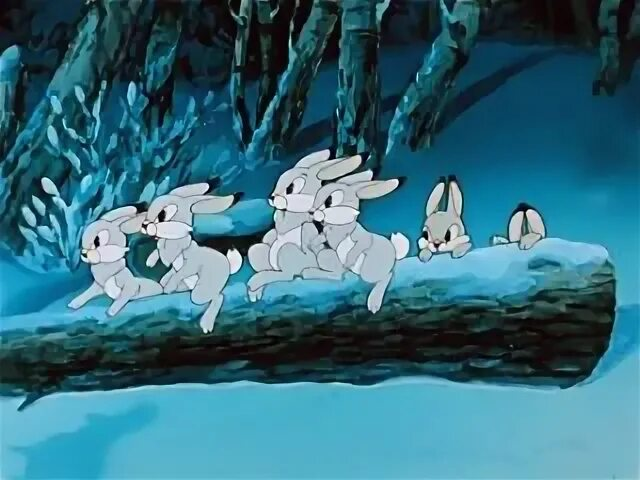

In [44]:
image

In [49]:
import time 
image = Image.open(requests.get(url, stream=True).raw).convert("RGB") 

start = time.time()

# Подготовка входных данных
inputs = processor(
    images=image, 
    text="Describe this image in detail.",
    return_tensors="pt"
).to("cuda")

# Генерация описания
outputs = model.generate(
    **inputs,
    max_length=256,
    num_beams=3,
    do_sample=False
)

# Декодирование результата
description = processor.batch_decode(outputs, skip_special_tokens=True)[0]
print("Generated description:", description, f'\n{time.time()-start:.2f}')

Generated description: Describe this image in detail. In this animated scene, a group of rabbits is sitting on a log in a snowy forest. The rabbits appear to be enjoying their time together, with one rabbit sitting in the middle of the log and the others sitting around it. The scene captures the joy and camaraderie of the rabbits as they spend time together in the snowy forest. 
18.28


1. Нет поддержки русского языка
2. Полное качественное описание
3. Долгий инференс:
20 секунд при num_beams=5,
18 секунд при num_beams=3 на Tesla P100.
4. Определяет домен мультика

## Nanonets

In [1]:
!pip install transformers --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.5/10.5 MB 73.5 MB/s eta 0:00:00:00:010:01
  Attempting uninstall: transformers
    Found existing installation: transformers 4.51.3
    Uninstalling transformers-4.51.3:
      Successfully uninstalled transformers-4.51.3


In [2]:
from PIL import Image
from transformers import AutoTokenizer, AutoProcessor, AutoModelForImageTextToText

model_path = "nanonets/Nanonets-OCR-s"

model = AutoModelForImageTextToText.from_pretrained(
    model_path, 
    torch_dtype="auto", 
    device_map="auto", 
    #attn_implementation="flash_attention_2"
)
model.eval()

tokenizer = AutoTokenizer.from_pretrained(model_path)
processor = AutoProcessor.from_pretrained(model_path)


2025-06-24 04:50:27.308229: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1750740627.504837      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1750740627.570189      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


config.json:   0%|          | 0.00/2.52k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/65.4k [00:00<?, ?B/s]

Fetching 2 files:   0%|          | 0/2 [00:00<?, ?it/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/2.51G [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/5.00G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/214 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/4.76k [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/2.78M [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/1.67M [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/11.4M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/605 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/613 [00:00<?, ?B/s]

chat_template.jinja:   0%|          | 0.00/1.02k [00:00<?, ?B/s]

preprocessor_config.json:   0%|          | 0.00/575 [00:00<?, ?B/s]

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


video_preprocessor_config.json:   0%|          | 0.00/1.73k [00:00<?, ?B/s]

In [23]:
import requests


def ocr_page_with_nanonets_s(image_path, model, prompt, processor, max_new_tokens=400, num_beams=1):
    image = Image.open(requests.get(image_path, stream=True).raw)
    messages = [
        {"role": "system", "content": "You are a helpful assistant."},
        {"role": "user", "content": [
            {"type": "image", "image": f"file://{image_path}"},
            {"type": "text", "text": prompt},
        ]},
    ]
    text = processor.apply_chat_template(messages, tokenize=False, add_generation_prompt=True)
    inputs = processor(text=[text], images=[image], padding=True, return_tensors="pt")
    inputs = inputs.to(model.device)
    
    output_ids = model.generate(**inputs, num_beams = num_beams, max_new_tokens=max_new_tokens, do_sample=False)
    generated_ids = [output_ids[len(input_ids):] for input_ids, output_ids in zip(inputs.input_ids, output_ids)]
    
    output_text = processor.batch_decode(generated_ids, skip_special_tokens=True, clean_up_tokenization_spaces=True)
    return output_text[0]

In [11]:
import requests
import time

url = "https://avatars.mds.yandex.net/i?id=f51b8a706e440ce25f2e7884eb4dbd22_sr-4702236-images-thumbs&n=13"
prompt = """Write full and detailized image caption for blind people. Include overall mood or message of the image. The caption must be in russian."""

start = time.time()

result = ocr_page_with_nanonets_s(url, model, prompt, processor, num_beams=4, max_new_tokens=200)
print(result, f'\n time needed = {time.time() - start:.2f}')

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


На изображении изображен мультфильмный сценарий с четырьмя кроликами. Кролики расположены на деревянной доске, которая лежит на земле. Вокруг кроликов видны деревья и другие элементы леса. Кролики выглядят игривыми и веселыми, что создает атмосферу радости и веселья. В целом, изображение передает чувство юмора и забавы, характерное для мультфильмов. 
 time needed = 34.83


1. При num_beams = 1 наблюдаются галлюцинации (найдены ноги человека на заднем плане, которого нет)
2. Приемлемое качество перевода на русский язык
3. Полное и детальное описание. Зависимость результата от промпта.

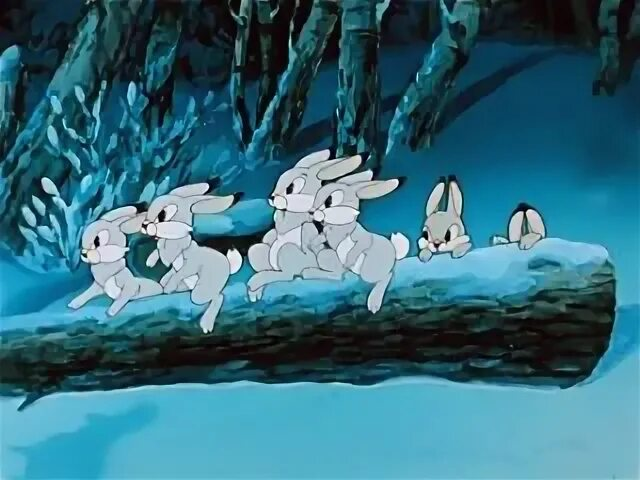

In [11]:
Image.open(requests.get(url, stream=True).raw)

In [42]:
import time


start = time.time()
prompt = """Write short image caption for blind people. Include overall mood. Caption must be in russian."""
result = ocr_page_with_nanonets_s(url, model, prompt, processor, num_beams=1, max_new_tokens=100)
print(result, f'\n time needed = {time.time() - start:.2f}')

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Кролики играют на дереве в снежном лесу. 
 time needed = 3.18


In [5]:
import time


url = 'https://riseandshine.childrensnational.org/wp-content/uploads/2024/10/Kids-collecting-food-FB.jpg'
prompt = """Write full and detailized image caption for blind people. Include overall mood or message of the image. The caption must be in russian."""

start = time.time()

result = ocr_page_with_nanonets_s(url, model, prompt, processor, num_beams=1, max_new_tokens=200)
print(result, f'\n time needed = {time.time() - start:.2f}')

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


Вот полный и детализированный описательный текст для слепых людей:

На переднем плане изображены несколько детей, которые участвуют в сборе донатов. Дети одеты в синие футболки. На переднем плане видны коробки с надписью "DONATIONS" (ДОНАТОВ). В коробках лежат различные предметы: баночки, одежда, ткани. На заднем плане виден человек, который держит телефон. Вокруг детей видны деревья и зеленая трава. Мягкий, теплый свет создает атмосферу доброты и помощи. 
 time needed = 15.00


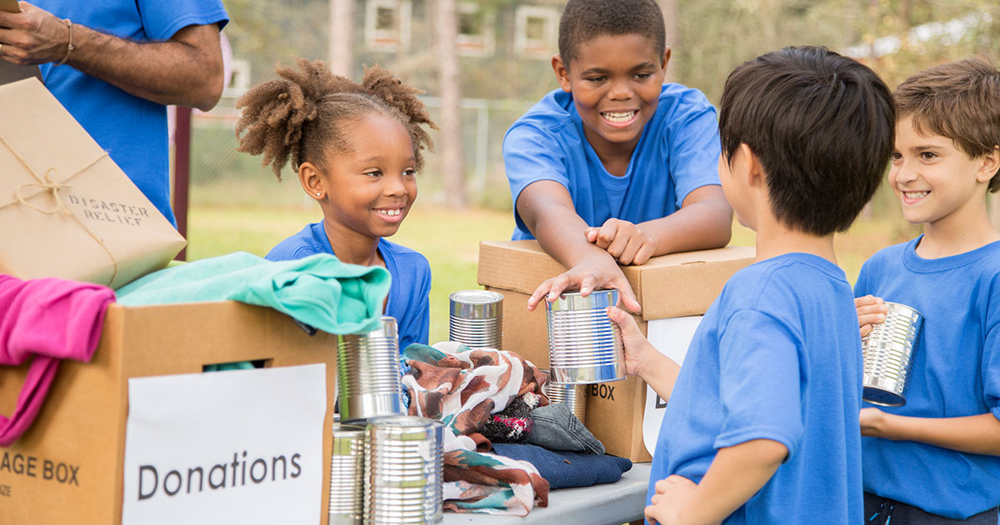

In [16]:
Image.open(requests.get(url, stream=True).raw)

In [6]:
url = 'https://images.kinorium.com/movie/shot/357941/w1500_51984999.jpg'

start = time.time()

result = ocr_page_with_nanonets_s(url, model, prompt, processor, num_beams=1, max_new_tokens=200)
print(result, f'\n time needed = {time.time() - start:.2f}')

The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


В этом изображении изображен аниме-сериал "Наруто". На переднем плане сидят три персонажа: Наруто, Сакура и Саске. Наруто смеется, положив руки за головой, Сакура смотрит на него, а Саске смотрит в сторону. Вокруг них видны деревянные стены и доски. Мягкий свет создает теплую атмосферу. 
 time needed = 14.11


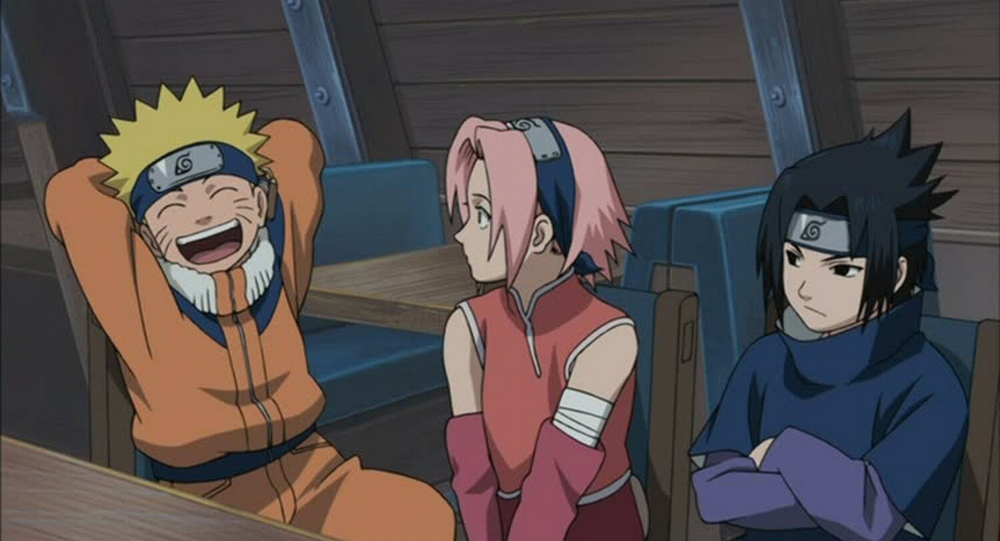

In [7]:
Image.open(requests.get(url, stream=True).raw)

In [34]:
prompt = 'If there is an image in the document and image caption is not present, add a small description of the image inside the <img></img> tag; otherwise, add the image caption inside <img></img>;'
#prompt = 'Если в документе присутствует изображение, добавь уверенное описание изображения на русском языке в теге <img></img>'
url = 'https://avatars.mds.yandex.net/i?id=f51b8a706e440ce25f2e7884eb4dbd22_sr-4702236-images-thumbs&n=13'

start = time.time()

result = ocr_page_with_nanonets_s(url, model, prompt, processor, num_beams=1, max_new_tokens=200)
print(result, f'\n time needed = {time.time() - start:.2f}')


The following generation flags are not valid and may be ignored: ['temperature']. Set `TRANSFORMERS_VERBOSITY=info` for more details.


<img>A group of animated rabbits in a snowy forest scene. The rabbits are standing on a log, with one rabbit looking up at something in the distance. The background features snow-covered trees and a blue sky.</img> 
 time needed = 5.30


Общие выводы:
1. Модель может галлюцинировать, при этом способна определять домен мультипликационной картинки
2. Качество перевода иногда ухудшает описание (в случае зайцев бревно было интерпретировано как доска)
3. Нет описания пространственного взаимоотношения объектов, как у Florence-2-large
4. Время инференса довольно большое. При этом описание может быть довольно полным и верным.
5. Без перевода время инференса меньше и качество описания лучше
6. Сама модель заточена на OCR, а не на Image capturing. Есть функционал LaTeX Equation Recognition, Signature Detection & Isolation, Watermark Extraction, Complex Table Extraction для работы с документами, текстом

# Общие выводы

## **Наилучшим решением кажется выбор Floreence-2-large модели. Она сочетает в себе дополнительный функционал для работы с изображениями, быстрый инференс, точные и полные описания. Но необходимо забахать переводчик, так как модель выдаёт описания только на английском языке**